### Imports

In [1]:
import pandas as pd
import numpy as np
import pywt
import math
import matplotlib as mpl

from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import MSTL
from statsmodels.tsa.seasonal import STL
from tslearn.metrics import cdist_dtw
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
from pycwt.helpers import find
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.decomposition import PCA
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.cluster import KMeans


In [2]:
df=pd.read_csv('../../../data/dataset.csv')

In [3]:
df.tail(5)

,date,demand,net_generation,total_interchange,net_generation_coal,net_generation_natural_gas,net_generation_nuclear,net_generation_hydropower_and_pumped_storage,net_generation_solar,net_generation_wind,...,TOBS,WESD,WSFG,WT01,WT03,WT04,WT05,WT06,WT11,consumption
3191,2024-09-26,72928.0,72284.0,-1913.0,22324.0,28769.0,10857.0,795.0,2569.0,6648.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83902.0
3192,2024-09-27,70208.0,66866.0,-4587.0,19276.0,25047.0,10850.0,839.0,1461.0,9149.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80772.0
3193,2024-09-28,68188.0,64603.0,-4712.0,18684.0,23013.0,10067.0,882.0,1753.0,9947.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78448.0
3194,2024-09-29,68686.0,64901.0,-4938.0,19005.0,24269.0,10066.0,845.0,1846.0,8634.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79021.0
3195,2024-09-30,75171.0,73779.0,-3023.0,19528.0,28041.0,10058.0,883.0,1905.0,13132.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86482.0


## Prepare the Data

Due to us using demand as a proxy for consumption it will have to be dropped as a feature.

Everything else will either have to be dropped if there is less that 90% non-nan values. Everything else will be backward filled and forward filled.

In [4]:
data = pd.read_csv("../../../data/dataset.csv", parse_dates=['date'])
thresh = int(0.9 * len(data))
data = data.dropna(axis=1, thresh=thresh).bfill().ffill()

In [5]:
data.head(12)

,date,demand,net_generation,total_interchange,net_generation_coal,net_generation_natural_gas,net_generation_nuclear,net_generation_hydropower_and_pumped_storage,net_generation_solar,net_generation_wind,...,SX53,TMAX,TMIN,TOBS,WESD,WSFG,WT01,WT03,WT11,consumption
0,2016-01-01,69621.0,67425.0,-3254.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,6.0,-59.0,-34.0,70.0,192.0,1.0,1.0,1.0,127103.0
1,2016-01-02,69855.0,67906.0,-2904.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,18.0,-62.0,-39.0,70.0,192.0,1.0,1.0,1.0,127530.0
2,2016-01-03,69944.0,67305.0,-3588.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,30.0,-56.0,-26.0,70.0,192.0,1.0,1.0,1.0,127693.0
3,2016-01-04,78335.0,77001.0,-2642.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,18.0,-65.0,-50.0,71.0,192.0,1.0,1.0,1.0,143012.0
4,2016-01-05,80600.0,81083.0,-896.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,7.0,-88.0,-57.0,71.0,192.0,1.0,1.0,1.0,147147.0
5,2016-01-06,77810.0,77836.0,-1242.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,26.0,-66.0,-26.0,69.0,192.0,1.0,1.0,1.0,142053.0
6,2016-01-07,74296.0,73027.0,-2336.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,50.0,-30.0,14.0,69.0,192.0,1.0,1.0,1.0,135638.0
7,2016-01-08,71589.0,69263.0,-3318.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,22.0,57.0,2.0,35.0,69.0,192.0,1.0,1.0,1.0,130696.0
8,2016-01-09,69738.0,66137.0,-4627.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,60.0,-26.0,-7.0,69.0,192.0,1.0,1.0,1.0,127317.0
9,2016-01-10,77088.0,72383.0,-5759.0,39962.0,20101.0,11610.0,746.0,0.0,3865.0,...,17.0,3.0,-127.0,-113.0,65.0,192.0,1.0,1.0,1.0,140735.0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3196 entries, 0 to 3195
Data columns (total 29 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   date                                          3196 non-null   datetime64[ns]
 1   demand                                        3196 non-null   float64       
 2   net_generation                                3196 non-null   float64       
 3   total_interchange                             3196 non-null   float64       
 4   net_generation_coal                           3196 non-null   float64       
 5   net_generation_natural_gas                    3196 non-null   float64       
 6   net_generation_nuclear                        3196 non-null   float64       
 7   net_generation_hydropower_and_pumped_storage  3196 non-null   float64       
 8   net_generation_solar                          3196 non-null   float6

In [7]:
## Global variables and settings and helper functions

### Plot settings

In [8]:
pyplot.style.use("seaborn-v0_8-whitegrid")
pyplot.rc("figure", autolayout=True, figsize=(11, 5))
pyplot.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'


### Global vairables

In [9]:
years=['2016','2017','2018','2019','2020','2021','2022','2023','2024']
months=['jan','fev','march','april','may','jun','jul','aug','sep','oct','nov','dec']
columns=[data.columns]


### Helper functions

In [10]:
#This function fileters the data frame by a series returns a series with a timeindex
def select_series(df,column, dateCol='date'):
    df['idx'] = pd.DatetimeIndex(df[dateCol])
    df = df.set_index('idx')
    df = df.drop(dateCol, axis=1)
    return df[column]

In [11]:
#this function takes a data frame, a series and divided the series by month, 
# returs a dictiornary by month for  the selected series
def montly_series(data,ser):
    series_dict=dict()
    name_series=[y+'_'+m for y in years for m in months]
    beg_end_months=pd.DataFrame(data=pd.to_datetime(data['date'].to_list()).normalize(), index=data['date'].to_list()).resample('MS')[0].agg(['min', 'max'])

    min_day=beg_end_months['min'].to_list()

    max_day=beg_end_months['max'].to_list()
   
    for d in range(105):
       series_dict.update({name_series[d]:data[(data.date >= min_day[d])&(data.date <= max_day[d])][ser].reset_index(drop=True)})
       
    return (series_dict)

## Preparing montly series for clustering

montly_series() takes two argument, df and a string to indicate the feature. It is a helper function that returns a dictionay with the monthly series. Features list, and other global variables on top of helper function section

In [12]:
def preparing_monthly_series(df,series):
    m_series=montly_series(df,series)
    s_=pd.DataFrame(m_series)
    #solving NaN
    S_df=s_.ffill().bfill().T.reindex()
    return (S_df)

In [13]:
TOBS_df=preparing_monthly_series(data,'TOBS')

In [14]:
TOBS_df.head()

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
2016_jan,-34.0,-39.0,-26.0,-50.0,-57.0,-26.0,14.0,35.0,-7.0,-113.0,...,-52.0,-60.0,-39.0,2.0,-1.0,-29.0,-3.0,-29.0,26.0,51.0
2016_fev,23.0,44.0,5.0,-49.0,-58.0,-19.0,11.0,-29.0,-75.0,-99.0,...,20.0,21.0,12.0,-5.0,-18.0,17.0,54.0,19.0,19.0,19.0
2016_march,-8.0,-46.0,-1.0,-12.0,18.0,34.0,88.0,125.0,106.0,76.0,...,55.0,70.0,60.0,8.0,39.0,62.0,44.0,48.0,94.0,111.0
2016_april,54.0,21.0,41.0,31.0,22.0,72.0,44.0,24.0,-4.0,57.0,...,105.0,93.0,117.0,135.0,118.0,103.0,102.0,97.0,106.0,106.0
2016_may,110.0,103.0,106.0,95.0,92.0,121.0,138.0,119.0,133.0,142.0,...,153.0,158.0,177.0,187.0,190.0,189.0,198.0,194.0,192.0,183.0


In [15]:
demand_df=preparing_monthly_series(data,'demand')

In [16]:
demand_df.tail()

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
2024_may,69796.0,70192.0,67440.0,64569.0,62077.0,68938.0,71536.0,71403.0,70697.0,67000.0,...,76124.0,74671.0,74470.0,69615.0,68023.0,68263.0,71124.0,70525.0,71568.0,70281.0
2024_jun,67398.0,68194.0,78646.0,81365.0,78418.0,76195.0,74771.0,70502.0,69643.0,73067.0,...,85469.0,82567.0,90279.0,92105.0,86021.0,82043.0,81793.0,83757.0,75565.0,75565.0
2024_jul,80030.0,82260.0,88167.0,80682.0,79145.0,77048.0,79319.0,86784.0,84576.0,83779.0,...,84325.0,84043.0,83164.0,83239.0,82358.0,80198.0,82582.0,92439.0,94475.0,95754.0
2024_aug,94263.0,92603.0,88412.0,87738.0,93548.0,87831.0,84323.0,84418.0,79717.0,72090.0,...,77592.0,80684.0,82203.0,87101.0,97006.0,95859.0,90457.0,89324.0,86198.0,77777.0
2024_sep,72732.0,70484.0,75796.0,78286.0,81046.0,74920.0,64276.0,63587.0,71706.0,74447.0,...,72008.0,73941.0,74301.0,73647.0,72928.0,70208.0,68188.0,68686.0,75171.0,75171.0


In [17]:
indices, rowSeries = zip(*demand_df.iterrows())


In [18]:
series_names=demand_df.index.to_list()

## Tunning hyperparameters for tskmeans demand and temperature series

### class sklearn.cluster.KMeans(n_clusters=8, init='k-means++', n_init=10, max_iter=300, tol=0.0001, precompute_distances='auto', verbose=0, random_state=None, copy_x=True, n_jobs=None, algorithm='auto')
TimeSeriesKmeans hyperparameters provides contrains on how the information would be clustered. the number of cluster k should be estimated, a similarity method should be chose.
the number of iterations represent how many iterations would it run until convergence
Relative tolerance with regards to Frobenius norm of the difference in the cluster centers of two consecutive iterations to declare convergence.
The most impactful are the number of clusters.

Wer are going to compare two meassures to define the optimal number of clusters. Distortion is taking into account only the tightness of the cluster(distortion is low when average of the squared distances between each point in a cluster and the cluster center is low). The closer all the points in a cluster are to the center of that same cluster, the lower the distortion.

Silhouette takes into account distances between points of one cluster and nearest cluster center. A good silhouette score, represents clusters that are tight and far from each other.

Two clusters that are tight, but close to each other, may produce a good distortion score and a bad silhouette score.It ranges from -1 to 1, with 1 indicating a perfect fit and -1 indicating a poor match


In [19]:
seed=42
#A rule of thumb is to chose the sqr root of the number of features in the dataset.
#In our case we have 105 dataseries representing a month of a 10 year period from jan2016 till Sep2024
#aprox.10. So were are going to create a list of k around this number starting with 4 to check if seasons would be clustered
k_range=range(3, 15)

In [20]:
def finding_k_inertia(df,k_range):
    scores = [] #this is Within-cluster sum of squares (WCSS)== inertia
    X_train=df
    scaler=MinMaxScaler()
    X_train=scaler.fit_transform(X_train)

    for n in k_range:
        kmeans = TimeSeriesKMeans(n_clusters=n, metric='dtw', random_state=42)
        kmeans.fit(X_train)
        scores.append(kmeans.inertia_)
    return scores

In [21]:
def finding_k_silhouete(df):
    scores = [] 
    X_train=df
    scaler=MinMaxScaler()
    X_train=scaler.fit_transform(X_train)

    for n in k_range:
        kmeans = TimeSeriesKMeans(n_clusters=n, metric='dtw', random_state=42, max_iter=900)
        labels=kmeans.fit_predict(X_train)
        scores.append(silhouette_score(X_train, labels, metric='euclidean'))
    return scores

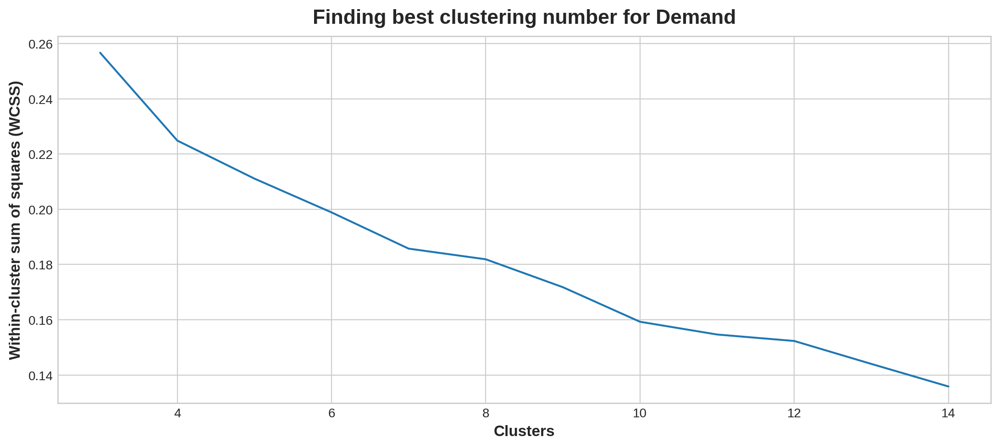

In [22]:
scores =finding_k_inertia(demand_df,k_range)
fig, axs=  pyplot.subplots()
axs.plot(k_range, scores)
axs.set_xlabel("Clusters"),
axs.set_ylabel("Within-cluster sum of squares (WCSS)"),
axs.set_title("Finding best clustering number for Demand")
pyplot.tight_layout()


Evaluating distortion:
The elbow plot shows a reduction in the decrease in wcss as the number of clusters increases from 4 to 10, indicating that adding more clusters significantly improves clustering quality up to this point. The “elbow” point, where the rate of decrease in inertia slows down, is observed at k = 10.

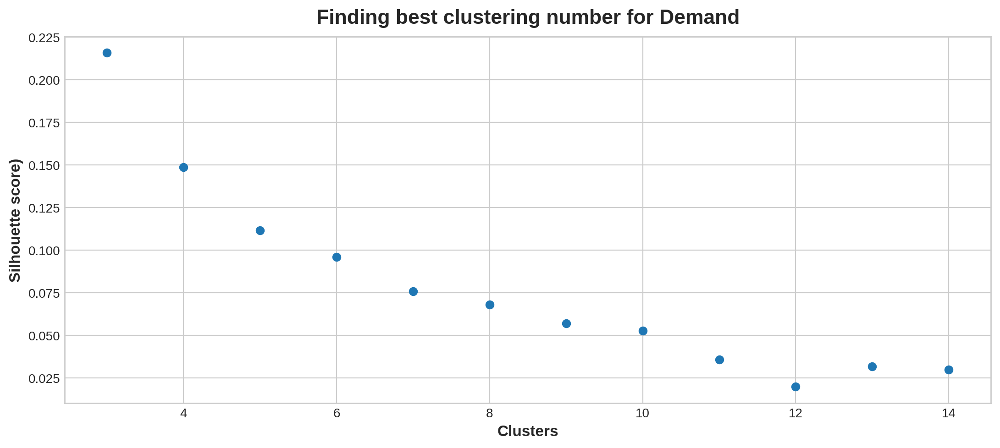

In [23]:
fig, axs=  pyplot.subplots()
axs.scatter(k_range, finding_k_silhouete(demand_df))
axs.set_xlabel("Clusters"),
axs.set_ylabel("Silhouette score)"),
axs.set_title("Finding best clustering number for Demand")
pyplot.tight_layout()

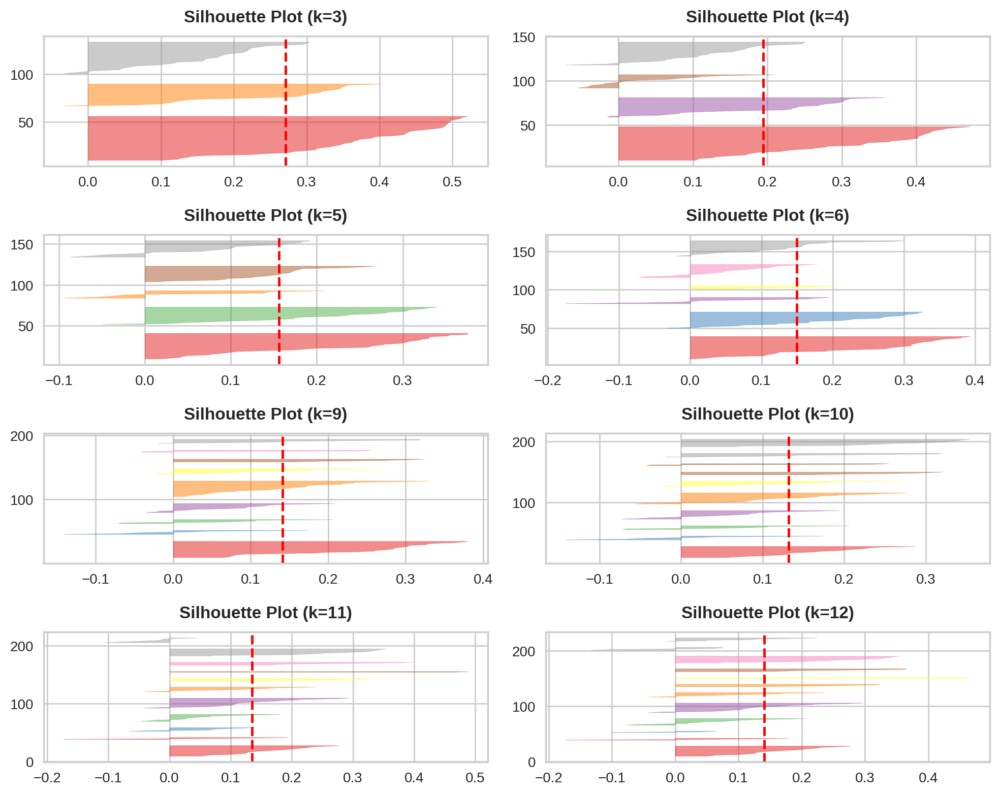

In [24]:
from yellowbrick.cluster import SilhouetteVisualizer


X_train=demand_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)

# Use the quick method and immediately show the figure
fig, axs = pyplot.subplots(4, 2, figsize=(10, 8))

for i, k in enumerate([3, 4, 5,6, 9,10,11,12]):
    # Calculate row and column index for the subplot
    row = i // 2
    col = i % 2

    # Create a KMeans model
    kmeans = KMeans(n_clusters=k, random_state=42)

    # Create a SilhouetteVisualizer
    visualizer = SilhouetteVisualizer(kmeans, ax=axs[row, col])

    # Fit the visualizer to the data
    visualizer.fit(X_train)

    # Set title for the subplot
    axs[row, col].set_title(f"Silhouette Plot (k={k})")

# Adjust layout and show the plot
pyplot.tight_layout()


Evaluating silhouette score:
The closest the score is to 1, there is a better separation inter clusters, near 0, the points in the series in the cluster are close to the neighbour cluster boundaries and values under 0 represent data that might be in the wrong cluster.
The silhouette score shows its best values (above 0.22), for 3 clusters. Analyzing the silhouette grpah we can see that for k=3, that has the highest average score, there is almost totally under the average score, and fewer series with negative scores, therefore less probable missplaced points than other clusters. The thicknes of the clusters is different, indicating that we have more points assigned to a particular cluster, that are redistributed to other cluster when we elevate the number.

## The best clustering model for Demand with Kmeans
we will choose to print the silhouett option to cluser the demand time series

In [25]:
def plotting_clusters(labels,series_name,series_list):
    cluster_count = 4
    plot_count = math.ceil(math.sqrt(2))
    

    fig, axs = pyplot.subplots(plot_count,plot_count,figsize=(25,25))
    fig.suptitle(str(series_name), fontsize=30,fontweight='bold')
    row_i=0
    column_j=0
    for label in set(labels):
        cluster = []
        for i in range(len(labels)):
                if(labels[i]==label):
                    axs[row_i, column_j].plot(series_list[i],c="gray",alpha=0.7)
                    cluster.append(series_list[i])
        if len(cluster) > 0:
            axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        axs[row_i, column_j].set_title("Cluster "+str(row_i*plot_count+column_j))
        column_j+=1
        if column_j%plot_count == 0:
            row_i+=1
            column_j=0
        
    pyplot.show()

In [26]:
series_names=demand_df.index.to_list()

In [27]:
def mapping_clusters(labels,columns=series_names):
    clusters_data=list(zip(columns, labels))
    
    cluster_map=pd.DataFrame(clusters_data)
    cluster_map=cluster_map.rename({0:'series', 1: 'cluster'},axis=1).reset_index(drop=True)
    
    cluster_map=cluster_map.sort_values('cluster')
    #grouped_clusters=cluster_map.groupby('cluster')
    return cluster_map

In [28]:
X_train=demand_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)

km = TimeSeriesKMeans(n_clusters=3, metric="dtw",random_state=seed)
labels_dm = km.fit_predict(X_train)

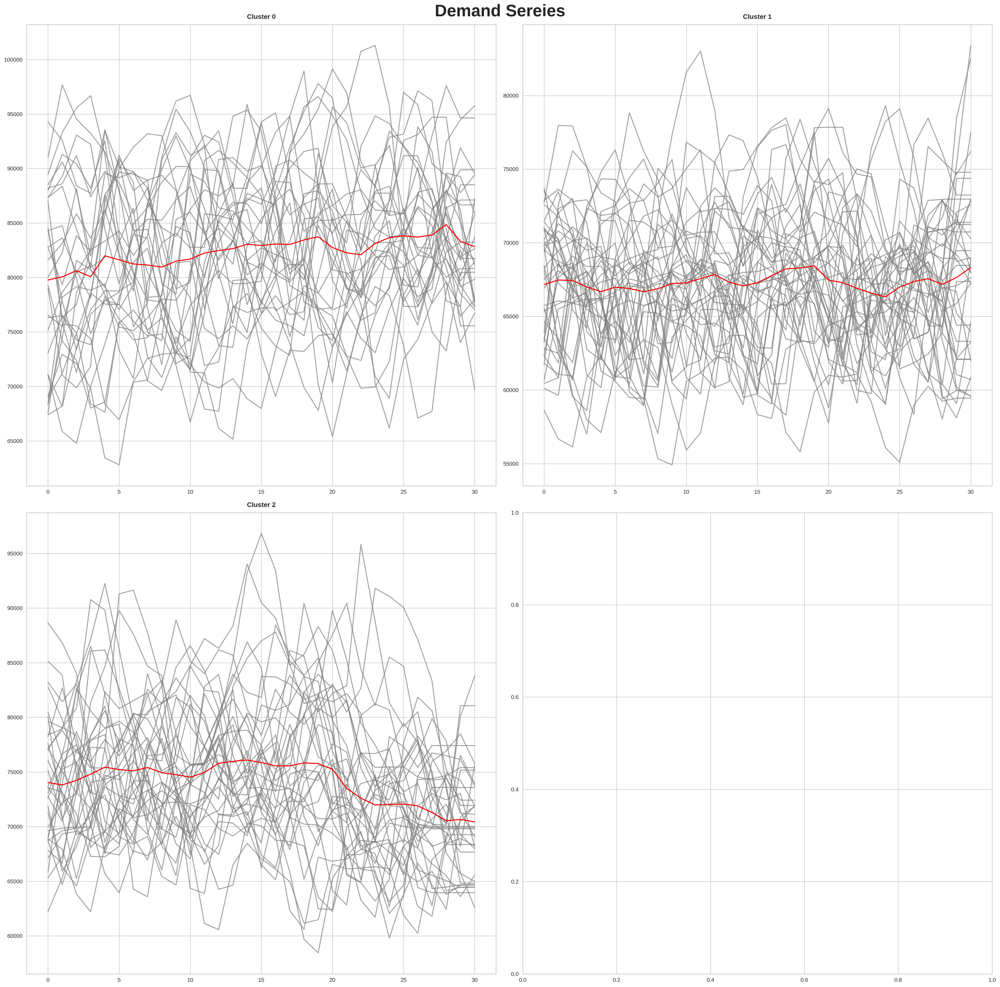

In [29]:
indices, rowSeries = zip(*demand_df.iterrows())

plotting_clusters(labels_dm,"Demand Sereies",rowSeries)

In [30]:
pd.set_option('display.max_rows', None)
demand_cluster_map=mapping_clusters(labels_dm)

### Finding best clusters for Temperature

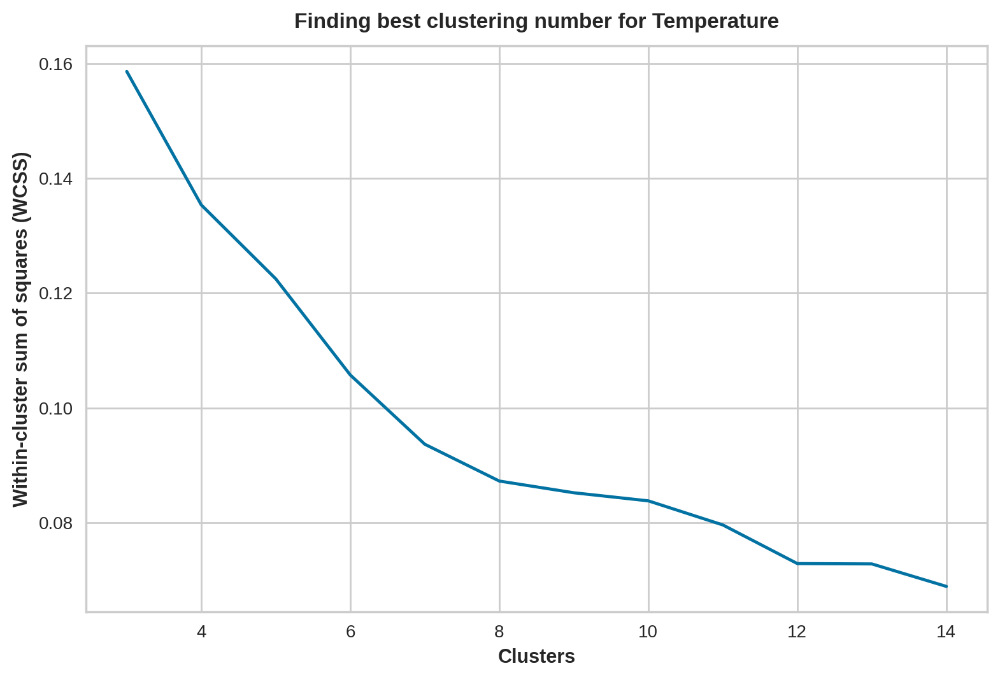

In [31]:
scores =finding_k_inertia(TOBS_df,k_range)
fig, axs=  pyplot.subplots()
axs.plot(k_range, scores)
axs.set_xlabel("Clusters"),
axs.set_ylabel("Within-cluster sum of squares (WCSS)"),
axs.set_title("Finding best clustering number for Temperature")
pyplot.tight_layout()

Evaluating distortion:
The elbow plot shows a reduction in the decrease in wcss as the number of clusters increases from 4 to 10, indicating that adding more clusters significantly improves clustering quality up to this point. The “elbow” point, where the rate of decrease in inertia slows down, is observed at k = 7.

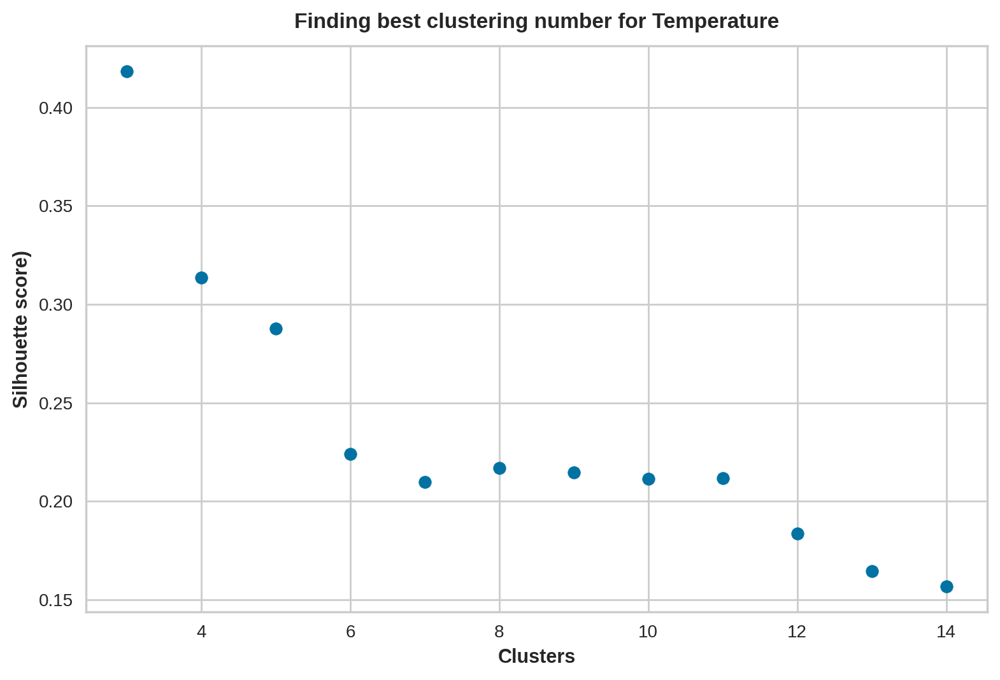

In [32]:
fig, axs=  pyplot.subplots()
axs.scatter(k_range, finding_k_silhouete(TOBS_df))
axs.set_xlabel("Clusters"),
axs.set_ylabel("Silhouette score)"),
axs.set_title("Finding best clustering number for Temperature")
pyplot.tight_layout()

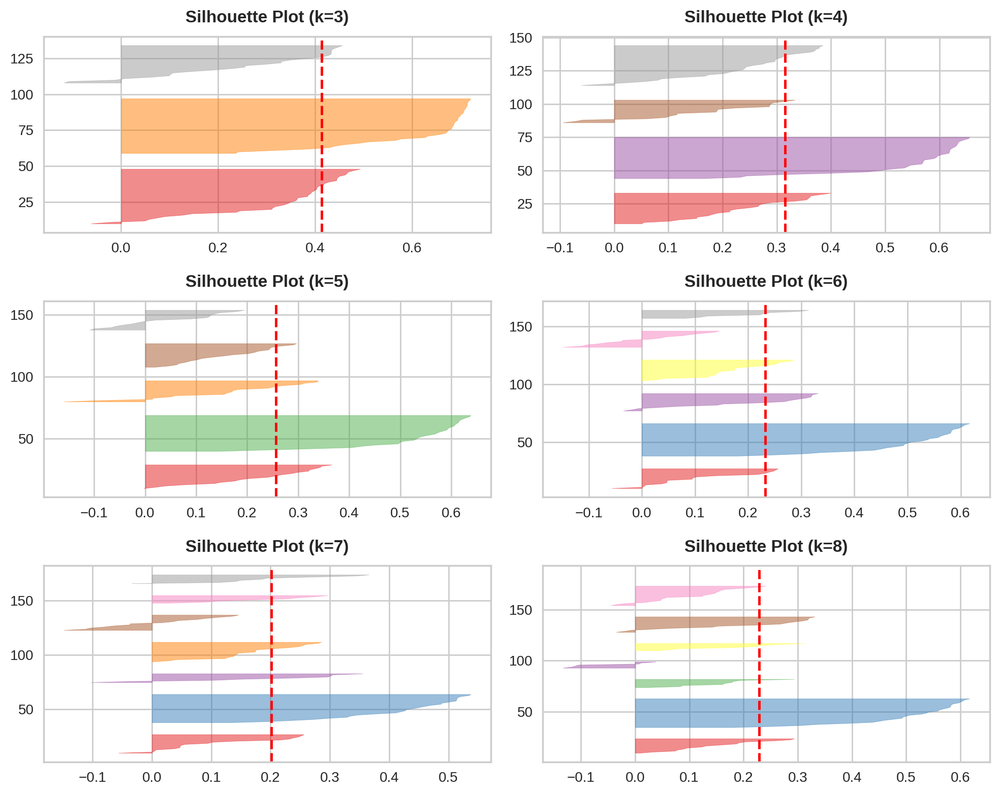

In [33]:
from yellowbrick.cluster import SilhouetteVisualizer


X_train=TOBS_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)

# Use the quick method and immediately show the figure
fig, axs = pyplot.subplots(3, 2, figsize=(10, 8))

for i, k in enumerate([3, 4, 5,6,7, 8]):
    # Calculate row and column index for the subplot
    row = i // 2
    col = i % 2

    # Create a KMeans model
    kmeans = KMeans(n_clusters=k, random_state=42)

    # Create a SilhouetteVisualizer
    visualizer = SilhouetteVisualizer(kmeans, ax=axs[row, col])

    # Fit the visualizer to the data
    visualizer.fit(X_train)

    # Set title for the subplot
    axs[row, col].set_title(f"Silhouette Plot (k={k})")

# Adjust layout and show the plot
pyplot.tight_layout()


Evaluating silhouette score:
The silhouette score shows its best values (above 0.4), for 3 clusters. Analyzing the silhouette grpah we can see that for k=3, that has the highest average score, most parts of cluster 1 data is under the average score , and fewer series with negative scores, therefore less probable missplaced points than other clusters. The thicknes of the clusters is simmilar, indicating that we have simmilar number of series assigned to a particular cluster. 
This cluster selection indicates that we might have 3 different levels of temperatures in the 10 year period.

## The best clustering model for Temperature with Kmeans
we will choose to print the silhouette option to cluser the Temperature time series

In [34]:
X_train=TOBS_df
scaler=MinMaxScaler()
X_train=scaler.fit_transform(X_train)

km = TimeSeriesKMeans(n_clusters=3, metric="dtw",random_state=seed)
labels_TOBS = km.fit_predict(X_train)

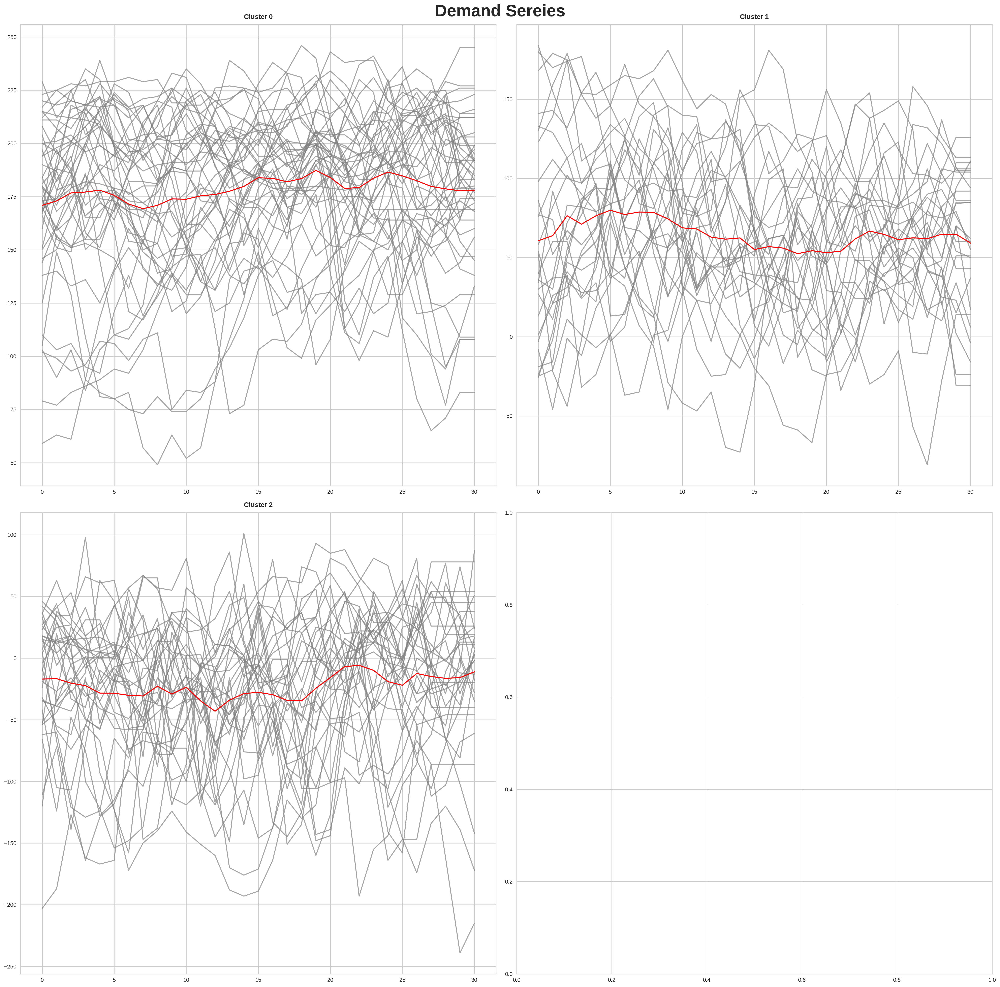

In [35]:
indices, rowSeries = zip(*TOBS_df.iterrows())

plotting_clusters(labels_TOBS,"Demand Sereies",rowSeries)

In [36]:
pd.set_option('display.max_rows', None)
TOBS_cluster_map=mapping_clusters(labels_TOBS)

### Comparing the "demand" and temperature -"TOBS"- clusters results

In [37]:
T_D_cluster_map=pd.concat([demand_cluster_map, TOBS_cluster_map], axis=1, join="outer")

In [38]:
T_D_cluster_map.sort_index(inplace=True)


In [39]:
T_D_cluster_map=T_D_cluster_map.set_axis(['demand_series', 'demand_c', 'TOBS_series', 'TOBS_c'], axis=1)

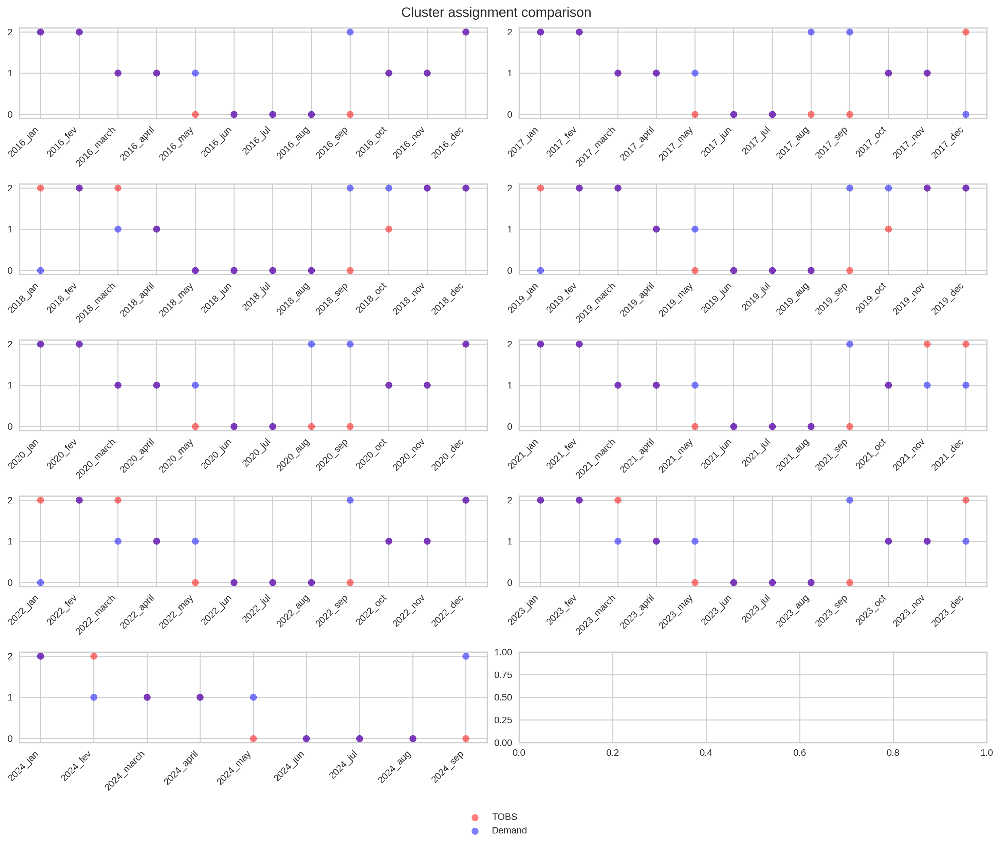

In [40]:
fig, ax = pyplot.subplots(5, 2, figsize=(15, 12))


ind=0
for i, x in enumerate([12,24,36,48,60,72,84,96,105]):

    row = i // 2
    col = i % 2
    ax[row,col].scatter(T_D_cluster_map['TOBS_series'][ind:x], T_D_cluster_map['TOBS_c'][ind:x], color='red',alpha=0.5, label='TOBS')
    # Plot the second scatter plot
    ax[row,col].scatter(T_D_cluster_map['demand_series'][ind:x],T_D_cluster_map['demand_c'][ind:x], color='blue',alpha=0.5, label='Demand')
    ind=x
    ax[row,col].set_xticks(ax[row,col].get_xticks(), ax[row,col].get_xticklabels(), rotation=45, ha='right')

# Add legend
labels_handles = {
  label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())
}

fig.legend(
  labels_handles.values(),
  labels_handles.keys(),
  loc = "upper center",
  bbox_to_anchor = (0.5, 0),
  bbox_transform = pyplot.gcf().transFigure,
)
fig.suptitle('Cluster assignment comparison')
pyplot.show()


Discusion: The comparison between the montly time series clustering through the years reveals that demand and temperature were cluster in simmilar ways for different years. For example, eventhough 2020 was a pandemic year and had many changes in the living and consumption routines, the montly of demand and temperature series were clustered in the same way that 2017, in both years temperature from may to september were clustered in cluster 1(0 in the graph) as well as demand for june and july (purple dots (blue+red)), demand in cluser 2(1 in the graph) and cluster 3 (2 in the graph) for august and september. Looking at the graphs of the exploratory analysis, the time series for the 10 year, we can see that there is a cycle that appears to repeat in the temperature every 4 years, that also is reflected in the demand seasonal decomposition.